In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline
sns.set(rc = {'figure.figsize':[10, 10]}, font_scale = 1.2)

In [2]:
# I'll import all csv files
df_train = pd.read_csv("/content/drive/MyDrive/House price prediction/train.csv")
df_test = pd.read_csv("/content/drive/MyDrive/House price prediction/test.csv")

In [3]:
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


From describtion we can see that

MSSubClass: Identifies the type of dwelling involved in the sale.	

        20	1-STORY 1946 & NEWER ALL STYLES
        30	1-STORY 1945 & OLDER
        40	1-STORY W/FINISHED ATTIC ALL AGES
        45	1-1/2 STORY - UNFINISHED ALL AGES
        50	1-1/2 STORY FINISHED ALL AGES
        60	2-STORY 1946 & NEWER
        70	2-STORY 1945 & OLDER
        75	2-1/2 STORY ALL AGES
        80	SPLIT OR MULTI-LEVEL
        85	SPLIT FOYER
        90	DUPLEX - ALL STYLES AND AGES
       120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
       150	1-1/2 STORY PUD - ALL AGES
       160	2-STORY PUD - 1946 & NEWER
       180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
       190	2 FAMILY CONVERSION - ALL STYLES AND AGES

MSZoning: Identifies the general zoning classification of the sale.
		
       A	Agriculture
       C	Commercial
       FV	Floating Village Residential
       I	Industrial
       RH	Residential High Density
       RL	Residential Low Density
       RP	Residential Low Density Park 
       RM	Residential Medium Density
	
LotFrontage: Linear feet of street connected to property

LotArea: Lot size in square feet

Street: Type of road access to property

       Grvl	Gravel	
       Pave	Paved
       	
Alley: Type of alley access to property

       Grvl	Gravel
       Pave	Paved
       NA 	No alley access
		
LotShape: General shape of property

       Reg	Regular	
       IR1	Slightly irregular
       IR2	Moderately Irregular
       IR3	Irregular
       
LandContour: Flatness of the property

       Lvl	Near Flat/Level	
       Bnk	Banked - Quick and significant rise from street grade to building
       HLS	Hillside - Significant slope from side to side
       Low	Depression
		
Utilities: Type of utilities available
		
       AllPub	All public Utilities (E,G,W,& S)	
       NoSewr	Electricity, Gas, and Water (Septic Tank)
       NoSeWa	Electricity and Gas Only
       ELO	Electricity only	
	
LotConfig: Lot configuration

       Inside	Inside lot
       Corner	Corner lot
       CulDSac	Cul-de-sac
       FR2	Frontage on 2 sides of property
       FR3	Frontage on 3 sides of property
	
LandSlope: Slope of property
		
       Gtl	Gentle slope
       Mod	Moderate Slope	
       Sev	Severe Slope
	
Neighborhood: Physical locations within Ames city limits

       Blmngtn	Bloomington Heights
       Blueste	Bluestem
       BrDale	Briardale
       BrkSide	Brookside
       ClearCr	Clear Creek
       CollgCr	College Creek
       Crawfor	Crawford
       Edwards	Edwards
       Gilbert	Gilbert
       IDOTRR	Iowa DOT and Rail Road
       MeadowV	Meadow Village
       Mitchel	Mitchell
       Names	North Ames
       NoRidge	Northridge
       NPkVill	Northpark Villa
       NridgHt	Northridge Heights
       NWAmes	Northwest Ames
       OldTown	Old Town
       SWISU	South & West of Iowa State University
       Sawyer	Sawyer
       SawyerW	Sawyer West
       Somerst	Somerset
       StoneBr	Stone Brook
       Timber	Timberland
       Veenker	Veenker
			
Condition1: Proximity to various conditions
	
       Artery	Adjacent to arterial street
       Feedr	Adjacent to feeder street	
       Norm	Normal	
       RRNn	Within 200' of North-South Railroad
       RRAn	Adjacent to North-South Railroad
       PosN	Near positive off-site feature--park, greenbelt, etc.
       PosA	Adjacent to postive off-site feature
       RRNe	Within 200' of East-West Railroad
       RRAe	Adjacent to East-West Railroad
	
Condition2: Proximity to various conditions (if more than one is present)
		
       Artery	Adjacent to arterial street
       Feedr	Adjacent to feeder street	
       Norm	Normal	
       RRNn	Within 200' of North-South Railroad
       RRAn	Adjacent to North-South Railroad
       PosN	Near positive off-site feature--park, greenbelt, etc.
       PosA	Adjacent to postive off-site feature
       RRNe	Within 200' of East-West Railroad
       RRAe	Adjacent to East-West Railroad
	
BldgType: Type of dwelling
		
       1Fam	Single-family Detached	
       2FmCon	Two-family Conversion; originally built as one-family dwelling
       Duplx	Duplex
       TwnhsE	Townhouse End Unit
       TwnhsI	Townhouse Inside Unit
	
HouseStyle: Style of dwelling
	
       1Story	One story
       1.5Fin	One and one-half story: 2nd level finished
       1.5Unf	One and one-half story: 2nd level unfinished
       2Story	Two story
       2.5Fin	Two and one-half story: 2nd level finished
       2.5Unf	Two and one-half story: 2nd level unfinished
       SFoyer	Split Foyer
       SLvl	Split Level
	
OverallQual: Rates the overall material and finish of the house

       10	Very Excellent
       9	Excellent
       8	Very Good
       7	Good
       6	Above Average
       5	Average
       4	Below Average
       3	Fair
       2	Poor
       1	Very Poor
	
OverallCond: Rates the overall condition of the house

       10	Very Excellent
       9	Excellent
       8	Very Good
       7	Good
       6	Above Average	
       5	Average
       4	Below Average	
       3	Fair
       2	Poor
       1	Very Poor
		
YearBuilt: Original construction date

YearRemodAdd: Remodel date (same as construction date if no remodeling or additions)

RoofStyle: Type of roof

       Flat	Flat
       Gable	Gable
       Gambrel	Gabrel (Barn)
       Hip	Hip
       Mansard	Mansard
       Shed	Shed
		
RoofMatl: Roof material

       ClyTile	Clay or Tile
       CompShg	Standard (Composite) Shingle
       Membran	Membrane
       Metal	Metal
       Roll	Roll
       Tar&Grv	Gravel & Tar
       WdShake	Wood Shakes
       WdShngl	Wood Shingles
		
Exterior1st: Exterior covering on house

       AsbShng	Asbestos Shingles
       AsphShn	Asphalt Shingles
       BrkComm	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       CemntBd	Cement Board
       HdBoard	Hard Board
       ImStucc	Imitation Stucco
       MetalSd	Metal Siding
       Other	Other
       Plywood	Plywood
       PreCast	PreCast	
       Stone	Stone
       Stucco	Stucco
       VinylSd	Vinyl Siding
       Wd Sdng	Wood Siding
       WdShing	Wood Shingles
	
Exterior2nd: Exterior covering on house (if more than one material)

       AsbShng	Asbestos Shingles
       AsphShn	Asphalt Shingles
       BrkComm	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       CemntBd	Cement Board
       HdBoard	Hard Board
       ImStucc	Imitation Stucco
       MetalSd	Metal Siding
       Other	Other
       Plywood	Plywood
       PreCast	PreCast
       Stone	Stone
       Stucco	Stucco
       VinylSd	Vinyl Siding
       Wd Sdng	Wood Siding
       WdShing	Wood Shingles
	
MasVnrType: Masonry veneer type

       BrkCmn	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       None	None
       Stone	Stone
	
MasVnrArea: Masonry veneer area in square feet

ExterQual: Evaluates the quality of the material on the exterior 
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
		
ExterCond: Evaluates the present condition of the material on the exterior
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
		
Foundation: Type of foundation
		
       BrkTil	Brick & Tile
       CBlock	Cinder Block
       PConc	Poured Contrete	
       Slab	Slab
       Stone	Stone
       Wood	Wood
		
BsmtQual: Evaluates the height of the basement

       Ex	Excellent (100+ inches)	
       Gd	Good (90-99 inches)
       TA	Typical (80-89 inches)
       Fa	Fair (70-79 inches)
       Po	Poor (<70 inches
       NA	No Basement
		
BsmtCond: Evaluates the general condition of the basement

       Ex	Excellent
       Gd	Good
       TA	Typical - slight dampness allowed
       Fa	Fair - dampness or some cracking or settling
       Po	Poor - Severe cracking, settling, or wetness
       NA	No Basement
	
BsmtExposure: Refers to walkout or garden level walls

       Gd	Good Exposure
       Av	Average Exposure (split levels or foyers typically score average or above)	
       Mn	Mimimum Exposure
       No	No Exposure
       NA	No Basement
	
BsmtFinType1: Rating of basement finished area

       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters	
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement
		
BsmtFinSF1: Type 1 finished square feet

BsmtFinType2: Rating of basement finished area (if multiple types)

       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters	
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement

BsmtFinSF2: Type 2 finished square feet

BsmtUnfSF: Unfinished square feet of basement area

TotalBsmtSF: Total square feet of basement area

Heating: Type of heating
		
       Floor	Floor Furnace
       GasA	Gas forced warm air furnace
       GasW	Gas hot water or steam heat
       Grav	Gravity furnace	
       OthW	Hot water or steam heat other than gas
       Wall	Wall furnace
		
HeatingQC: Heating quality and condition

       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
		
CentralAir: Central air conditioning

       N	No
       Y	Yes
		
Electrical: Electrical system

       SBrkr	Standard Circuit Breakers & Romex
       FuseA	Fuse Box over 60 AMP and all Romex wiring (Average)	
       FuseF	60 AMP Fuse Box and mostly Romex wiring (Fair)
       FuseP	60 AMP Fuse Box and mostly knob & tube wiring (poor)
       Mix	Mixed
		
1stFlrSF: First Floor square feet
 
2ndFlrSF: Second floor square feet

LowQualFinSF: Low quality finished square feet (all floors)

GrLivArea: Above grade (ground) living area square feet

BsmtFullBath: Basement full bathrooms

BsmtHalfBath: Basement half bathrooms

FullBath: Full bathrooms above grade

HalfBath: Half baths above grade

Bedroom: Bedrooms above grade (does NOT include basement bedrooms)

Kitchen: Kitchens above grade

KitchenQual: Kitchen quality

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       	
TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)

Functional: Home functionality (Assume typical unless deductions are warranted)

       Typ	Typical Functionality
       Min1	Minor Deductions 1
       Min2	Minor Deductions 2
       Mod	Moderate Deductions
       Maj1	Major Deductions 1
       Maj2	Major Deductions 2
       Sev	Severely Damaged
       Sal	Salvage only
		
Fireplaces: Number of fireplaces

FireplaceQu: Fireplace quality

       Ex	Excellent - Exceptional Masonry Fireplace
       Gd	Good - Masonry Fireplace in main level
       TA	Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement
       Fa	Fair - Prefabricated Fireplace in basement
       Po	Poor - Ben Franklin Stove
       NA	No Fireplace
		
GarageType: Garage location
		
       2Types	More than one type of garage
       Attchd	Attached to home
       Basment	Basement Garage
       BuiltIn	Built-In (Garage part of house - typically has room above garage)
       CarPort	Car Port
       Detchd	Detached from home
       NA	No Garage
		
GarageYrBlt: Year garage was built
		
GarageFinish: Interior finish of the garage

       Fin	Finished
       RFn	Rough Finished	
       Unf	Unfinished
       NA	No Garage
		
GarageCars: Size of garage in car capacity

GarageArea: Size of garage in square feet

GarageQual: Garage quality

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       NA	No Garage
		
GarageCond: Garage condition

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       NA	No Garage
		
PavedDrive: Paved driveway

       Y	Paved 
       P	Partial Pavement
       N	Dirt/Gravel
		
WoodDeckSF: Wood deck area in square feet

OpenPorchSF: Open porch area in square feet

EnclosedPorch: Enclosed porch area in square feet

3SsnPorch: Three season porch area in square feet

ScreenPorch: Screen porch area in square feet

PoolArea: Pool area in square feet

PoolQC: Pool quality
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       NA	No Pool
		
Fence: Fence quality
		
       GdPrv	Good Privacy
       MnPrv	Minimum Privacy
       GdWo	Good Wood
       MnWw	Minimum Wood/Wire
       NA	No Fence
	
MiscFeature: Miscellaneous feature not covered in other categories
		
       Elev	Elevator
       Gar2	2nd Garage (if not described in garage section)
       Othr	Other
       Shed	Shed (over 100 SF)
       TenC	Tennis Court
       NA	None
		
MiscVal: $Value of miscellaneous feature

MoSold: Month Sold (MM)

YrSold: Year Sold (YYYY)

SaleType: Type of sale
		
       WD 	Warranty Deed - Conventional
       CWD	Warranty Deed - Cash
       VWD	Warranty Deed - VA Loan
       New	Home just constructed and sold
       COD	Court Officer Deed/Estate
       Con	Contract 15% Down payment regular terms
       ConLw	Contract Low Down payment and low interest
       ConLI	Contract Low Interest
       ConLD	Contract Low Down
       Oth	Other
		
SaleCondition: Condition of sale

       Normal	Normal Sale
       Abnorml	Abnormal Sale -  trade, foreclosure, short sale
       AdjLand	Adjoining Land Purchase
       Alloca	Allocation - two linked properties with separate deeds, typically condo with a garage unit	
       Family	Sale between family members
       Partial	Home was not completed when last assessed (associated with New Homes)

In [4]:
df_train.describe().T # T for transform as we have like 81 column
# from describtion we should see if there were any outliers

,count,mean,std,min,25%,50%,75%,max
Id,1460.0,730.500000,421.610009,1.0,365.75,730.5,1095.25,1460.0
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0


In [5]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [6]:
df_train.shape

(1460, 81)

In [7]:
## by looking to 81 columns we could see our first insights
null_percentage = df_train.isnull().sum() * 100 / len(df_train)
null_percentage = pd.DataFrame(data=null_percentage)
pd.set_option('display.max_rows', 81)
null_percentage

,0
Id,0.000000
MSSubClass,0.000000
MSZoning,0.000000
LotFrontage,17.739726
LotArea,0.000000
Street,0.000000
Alley,93.767123
LotShape,0.000000
LandContour,0.000000
Utilities,0.000000


As a first insight more than 50% of data we should drop columns from it

- PoolQC is 99% null
- MiscFeature is 96% null
- Fence is 80.7% null
-	Alley	93.767123% null

In [9]:
## here we will try to visualize our missing data
!pip install missingno

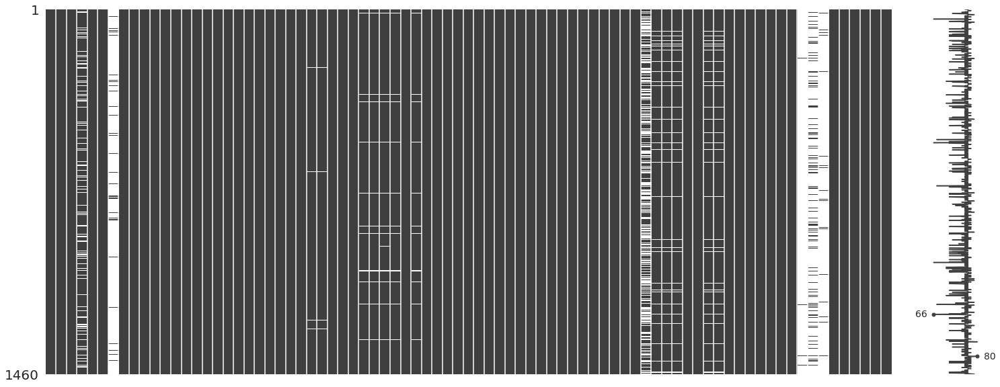

In [10]:
import missingno as msno
## In depth info about missing data
msno.matrix(df_train)

On the right side of the plot is a sparkline that ranges from 0 on the left to the total number of columns in the dataframe on the right. 

When a row has a value in each column, the line will be at the maximum right position. As missing values start to increase within that row the line will move towards the left.

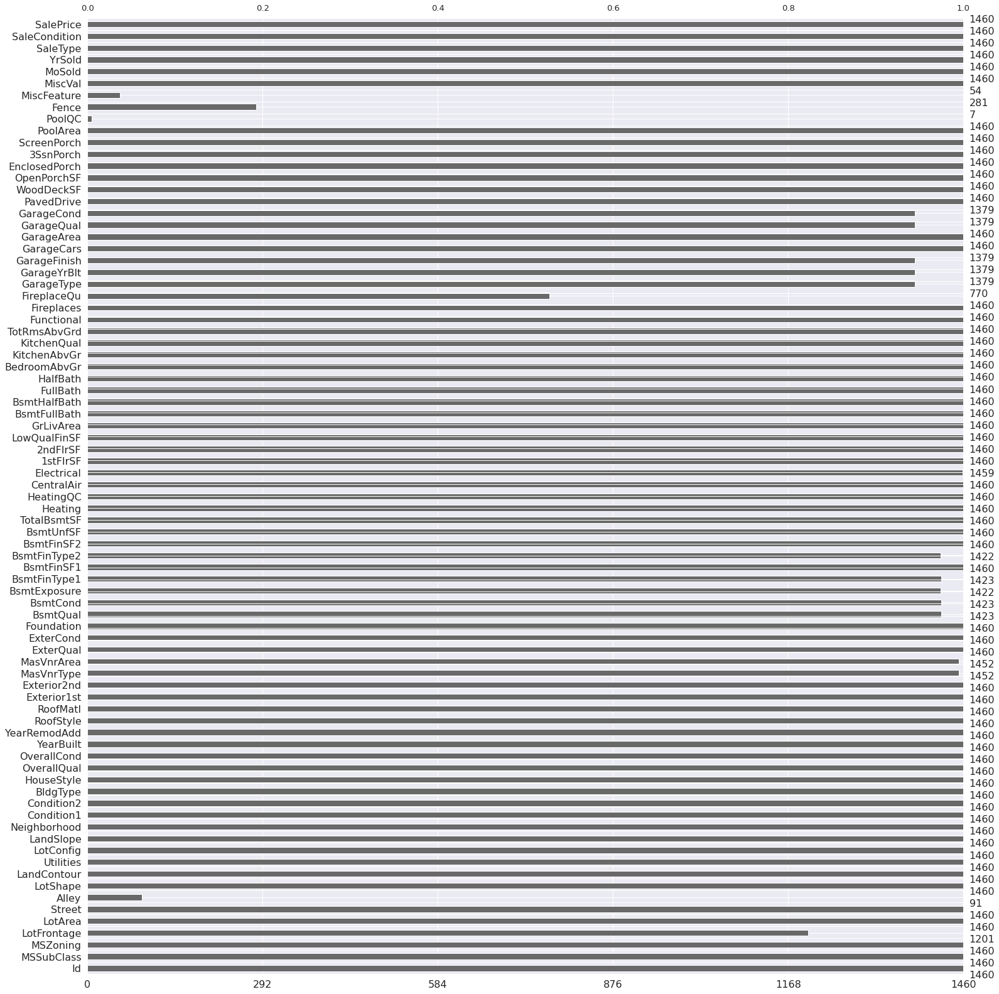

In [11]:
# general info
msno.bar(df_train)

In [12]:
df_train_copy = df_train.copy()

In [13]:
df_train_copy.drop(['PoolQC', 'MiscFeature', 'Fence', 'Alley'], axis=1, inplace = True)

In [14]:
df_train_copy.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,1460.0,730.500000,421.610009,1.0,365.75,730.5,1095.25,1460.0
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0


In [15]:
pd.set_option('display.max_columns', 77)

In [16]:
df_train_copy.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000


In [17]:
## So our final goal is to predict price column depending on various inputs
## So we should tune values and going through each column
df_train_copy['MSZoning'].value_counts()

RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64

In [18]:
df_train_copy['Street'].value_counts()

Pave    1454
Grvl       6
Name: Street, dtype: int64

In [19]:
df_train_copy['LotShape'].value_counts()

Reg    925
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64

In [20]:
df_train_copy['LandContour'].value_counts()

Lvl    1311
Bnk      63
HLS      50
Low      36
Name: LandContour, dtype: int64

In [21]:
df_train_copy['Utilities'].value_counts()

AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64

In [22]:
df_train_copy['LotConfig'].value_counts()

Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64

In [23]:
df_train_copy['LandSlope'].value_counts()

Gtl    1382
Mod      65
Sev      13
Name: LandSlope, dtype: int64

In [24]:
df_train_copy['Neighborhood'].value_counts()

NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      37
ClearCr     28
StoneBr     25
SWISU       25
MeadowV     17
Blmngtn     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: Neighborhood, dtype: int64

In [25]:
df_train_copy['Condition1'].value_counts()

Norm      1260
Feedr       81
Artery      48
RRAn        26
PosN        19
RRAe        11
PosA         8
RRNn         5
RRNe         2
Name: Condition1, dtype: int64

In [26]:
df_train_copy['BldgType'].value_counts()

1Fam      1220
TwnhsE     114
Duplex      52
Twnhs       43
2fmCon      31
Name: BldgType, dtype: int64

In [27]:
df_train_copy['HouseStyle'].value_counts()

1Story    726
2Story    445
1.5Fin    154
SLvl       65
SFoyer     37
1.5Unf     14
2.5Unf     11
2.5Fin      8
Name: HouseStyle, dtype: int64

In [28]:
df_train_copy.shape

(1460, 77)

- MSZoning: Identifies the general zoning classification of the sale.
- Street: Type of road access to property
- LotShape: General shape of property
- LandContour: Flatness of the property
- Utilities: Type of utilities available
- LandSlope: Slope of property
- Neighborhood: Physical locations within Ames city limits
- Condition1: Proximity to various conditions

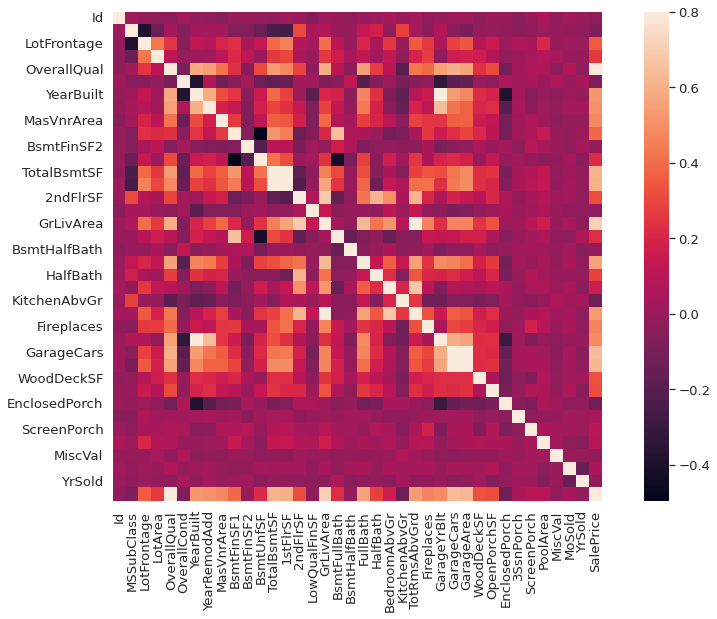

In [29]:
plt.rcParams['figure.figsize'] = (15.0, 9.0)
train_corr = df_train_copy.corr()
sns.heatmap(train_corr, vmax=.8, square=True);

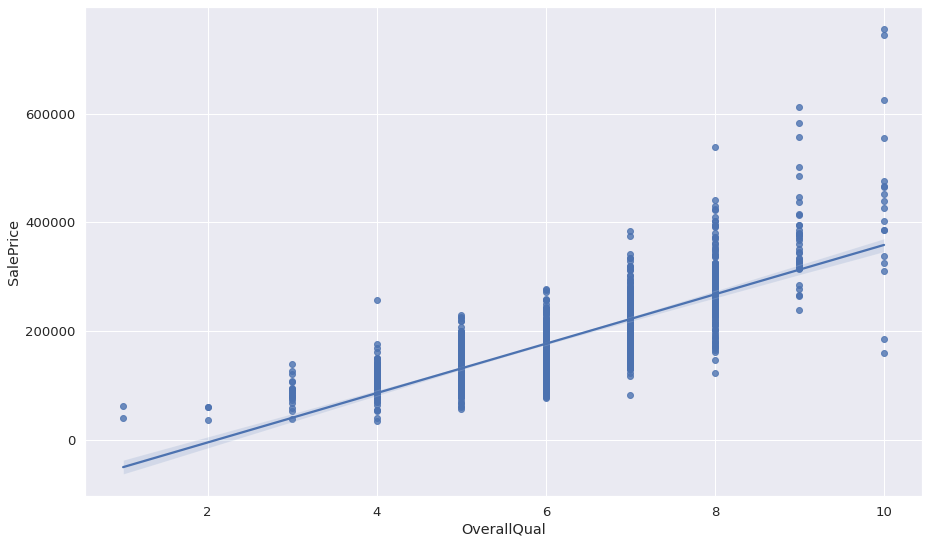

In [30]:
## We will be getting correlation between price and overall quality, condition quality
sns.regplot(x=df_train_copy["OverallQual"], y=df_train_copy["SalePrice"])

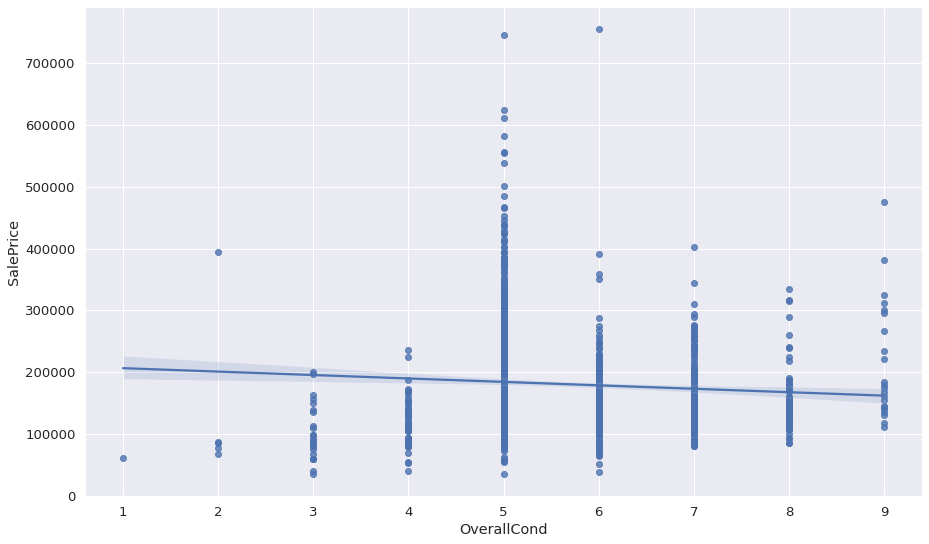

In [31]:
sns.regplot(x=df_train_copy["OverallCond"], y=df_train_copy["SalePrice"])

- lotFrontage and LotArea in square feet so we will convert it into meters
  - square feet * 0.092903 = 1 meter

- LotArea is feet length So to convert from feet length into meter length
  - feet length * 0.3048 =  1 meter

- Is there like a relation between LotFrontage and LotArea

- OverallQual and condition is categorical values Like from bad to excellent

- Is there any changing happend? YearRemodAdd - YearBuilt = if 0 = No if else = yes

- Is there any specific physical location that make our saleprice high

conditions 1 & 2 are conditions that may exist Norm or not
- We can make a new column that have 3 types of conditions 
  
    - if condition 1 = condition 2 return norm elif condition 1 = norm and condition 2 != norm return half norm if condition 1 != condition 2 return not norm

Exterior 1st & 2nd: Exterior covering on house

Masonry veneer type and ExterQual and ExterCond

-  Evaluates the quality of the material on the exterior relation and will keep ExterQual
-  ExterCond: Evaluates the present condition of the material on the exterior
Masonry veneer area in square feet

BsmtQual in inches --> height of basement
-       Ex excellent (100+ inches)	
-       Gd	Good (90-99 inches)
-       TA	Typical (80-89 inches)
-       Fa	Fair (70-79 inches)
-       Po	Poor (<70 inches)
-       NA	No Basement


1 inch * 0.0254 = 1 meter

BsmtFin

BsmtCond general condition

BldgType: Type of dwellingType get_dummies

# Is there like a relation between LotFrontage and LotArea?

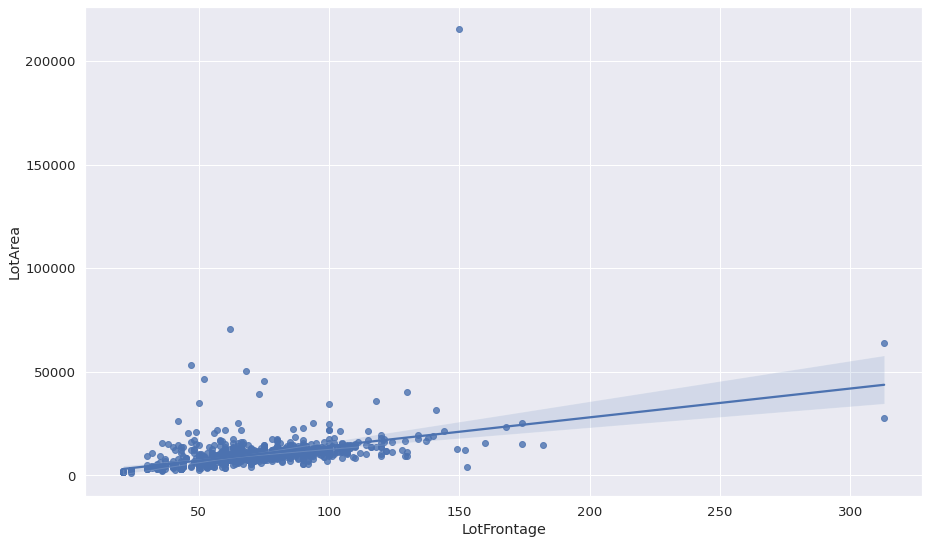

In [32]:
# Is there like a relation between LotFrontage and LotArea
sns.regplot(x=df_train_copy["LotFrontage"], y=df_train_copy["LotArea"])

We can see like there's an outlier in LotArea

In [33]:
## remove outliers
q1 = df_train_copy["LotArea"].quantile(0.25)
q3 = df_train_copy["LotArea"].quantile(0.75)
iqr = q3-q1
min_wisk = q1 - 1.5 * iqr
max_wisk = q3 + 1.5 * iqr

In [34]:
clean_train = df_train_copy[  df_train_copy['LotArea'].between(min_wisk, max_wisk)  ]
clean_train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,NaN,Attchd,1950.0,Unf,1,240,TA,TA,Y,366,0,112,0,0,0,0,4,2010,WD,Normal,142125


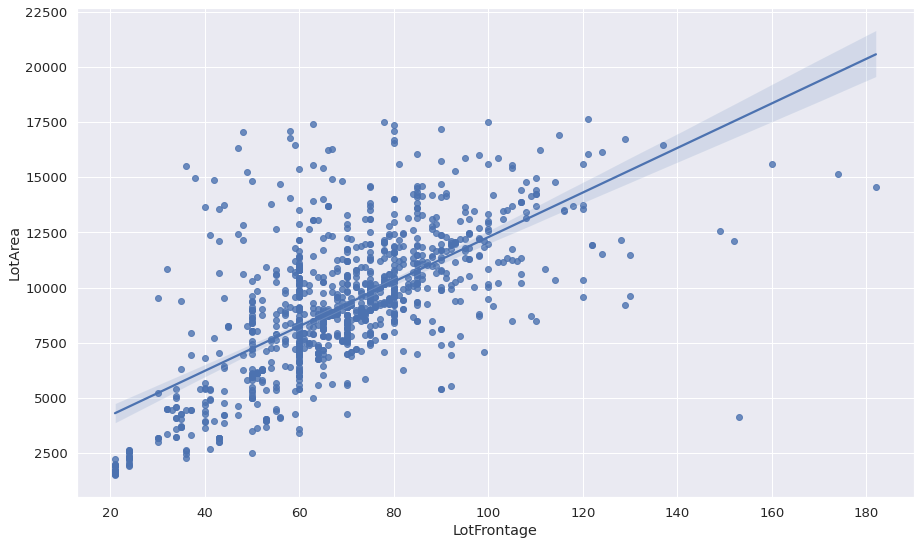

In [35]:
# after removing outliers
sns.regplot(x=clean_train["LotFrontage"], y=clean_train["LotArea"])

In [36]:
## No duplicates
df_train_copy[  df_train_copy.duplicated()  ]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


In [37]:
df_train_copy.groupby('YearBuilt').sum()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
YearBuilt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1872,1350,70,50.0,5250,8,5,1987,0.0,259,0,425,684,938,1215,205,2358,0,0,2,0,4,1,8,0,0.0,0,0,0,54,20,0,0,0,0,12,2008,122000
1875,1138,50,54.0,6342,5,8,1996,0.0,0,0,780,780,780,240,0,1020,0,0,1,0,2,1,6,0,0.0,0,0,0,0,176,0,0,0,0,5,2010,94000
1880,2817,285,292.0,48986,25,26,7946,0.0,0,0,4354,4354,5262,4831,0,10093,0,0,7,1,15,4,34,2,7820.0,9,2179,483,48,679,0,0,0,0,21,8030,802479
1882,992,70,121.0,17671,8,9,1986,0.0,216,0,700,916,916,826,0,1742,0,0,1,1,4,1,8,1,1925.0,2,424,0,169,0,0,0,0,0,11,2009,168000
1885,1524,220,120.0,22140,8,13,3945,0.0,0,0,1418,1418,2293,1044,0,3337,0,0,3,0,6,3,17,0,3925.0,3,833,0,0,114,0,0,0,450,12,4017,222500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2006,52205,3480,5120.0,696963,507,335,134423,11031.0,22326,0,68528,90854,91876,20377,0,112253,21,3,132,28,176,67,468,51,132407.0,167,45395,8551,4536,37,0,295,0,0,469,134467,16868955
2007,33947,2100,3833.0,512359,379,249,98358,8531.0,24511,0,46557,71068,71624,12727,0,84351,20,1,98,11,135,49,350,30,96345.0,123,33224,5265,4030,0,0,694,0,0,345,98384,12512774
2008,20009,980,2122.0,323885,199,115,46191,7362.0,19118,539,23648,43305,41436,7856,0,49292,13,1,47,11,63,23,192,23,46189.0,63,19668,2400,2298,0,457,586,480,0,145,46203,8023530


In [38]:
df_train_copy.groupby('YearRemodAdd').sum()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
YearRemodAdd,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1950,138589,9870,9878.0,1582031,894,984,343594,3349.0,31781,2784,99884,134449,163505,68790,3372,235667,34,6,216,32,503,194,1100,86,301704.0,213,56168,5872,4708,10878,144,2192,0,7830,1090,357368,20908424
1951,3415,80,356.0,46045,18,20,7804,44.0,2564,0,2224,4788,5172,0,0,5172,1,0,5,0,10,4,21,0,7841.0,8,2164,0,30,0,0,0,0,0,26,8030,519900
1952,3161,200,328.0,41454,23,24,9760,360.0,717,551,2122,3390,5006,1475,0,6481,0,1,7,0,14,6,30,0,9812.0,9,2460,0,0,0,0,0,0,54,35,10044,551993
1953,5248,410,712.0,114691,54,48,19503,892.0,5286,1049,4875,11210,12917,983,0,13900,5,0,12,0,24,10,55,10,19551.0,17,4524,342,173,450,162,287,0,0,64,20077,1476400
1954,11092,505,878.0,146056,69,73,27356,777.0,5032,290,8083,13405,14820,1321,0,16141,3,0,16,0,37,15,75,6,25457.0,17,4474,511,316,474,0,0,0,0,81,28106,1696000
1955,5246,590,507.0,114802,40,49,17580,421.0,2878,125,3536,6539,10494,521,0,11015,2,0,12,1,26,11,56,4,13725.0,11,3752,385,75,0,0,265,0,0,48,18071,1120600
1956,6142,225,490.0,100921,48,54,19560,194.0,3732,0,5782,9514,11032,0,0,11032,3,0,10,0,24,10,53,2,17604.0,10,3160,108,109,0,0,352,0,0,68,20084,1242350
1957,6615,180,579.0,88731,46,47,17613,387.0,5127,661,3383,9171,10016,0,0,10016,5,0,9,3,25,9,49,7,17620.0,11,3067,818,40,0,0,530,0,0,49,18071,1193908
1958,11794,730,947.0,150570,79,83,29315,1483.0,5455,1263,7940,14658,17351,1318,0,18669,6,3,17,2,44,16,89,4,27428.0,20,5554,392,143,569,0,651,0,1900,92,30110,1925800


# Is there any changing happend through years?? 

- YearRemodAdd - YearBuilt = if 0 = No if else = yes

Why this we want to know if there was any change or not and we will drop 2 year columns

In [39]:
# clean_train
clean_train['year_diff'] = clean_train['YearRemodAdd']- clean_train['YearBuilt']
clean_train['year_diff']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


0        0
1        0
2        1
3       55
4        0
        ..
1455     1
1456    10
1457    65
1458    46
1459     0
Name: year_diff, Length: 1391, dtype: int64

In [40]:
clean_train['Is_diff'] = clean_train['year_diff'].apply(lambda x: 0 if x == 0 else 1)
clean_train['Is_diff']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


0       0
1       0
2       1
3       1
4       0
       ..
1455    1
1456    1
1457    1
1458    1
1459    0
Name: Is_diff, Length: 1391, dtype: int64

In [41]:
clean_train.loc[clean_train['SalePrice'] == clean_train['SalePrice'].max()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,year_diff,Is_diff
1182,1183,60,RL,160.0,15623,Pave,IR1,Lvl,AllPub,Corner,Gtl,NoRidge,Norm,Norm,1Fam,2Story,10,5,1996,1996,Hip,CompShg,Wd Sdng,ImStucc,None,0.0,Gd,TA,PConc,Ex,TA,Av,GLQ,2096,Unf,0,300,2396,...,SBrkr,2411,2065,0,4476,1,0,3,1,4,1,Ex,10,Typ,2,TA,Attchd,1996.0,Fin,3,813,TA,TA,Y,171,78,0,0,0,555,0,7,2007,WD,Abnorml,745000,0,0


In [42]:
clean_train.loc[clean_train['SalePrice'] == clean_train['SalePrice'].min()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,year_diff,Is_diff
495,496,30,C (all),60.0,7879,Pave,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Norm,Norm,1Fam,1Story,4,5,1920,1950,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,495,Unf,0,225,720,...,FuseA,720,0,0,720,0,0,1,0,2,1,TA,4,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,N,0,523,115,0,0,0,0,11,2009,WD,Abnorml,34900,30,1


- 1996 Year built without any modification and sold on 2007 but 745000 SalePrice
- While 1920 and modified on 1950 and sold on 2009 is the minimum with 34900 SalePrice

- So let's check the relation between year sold and SalePrice

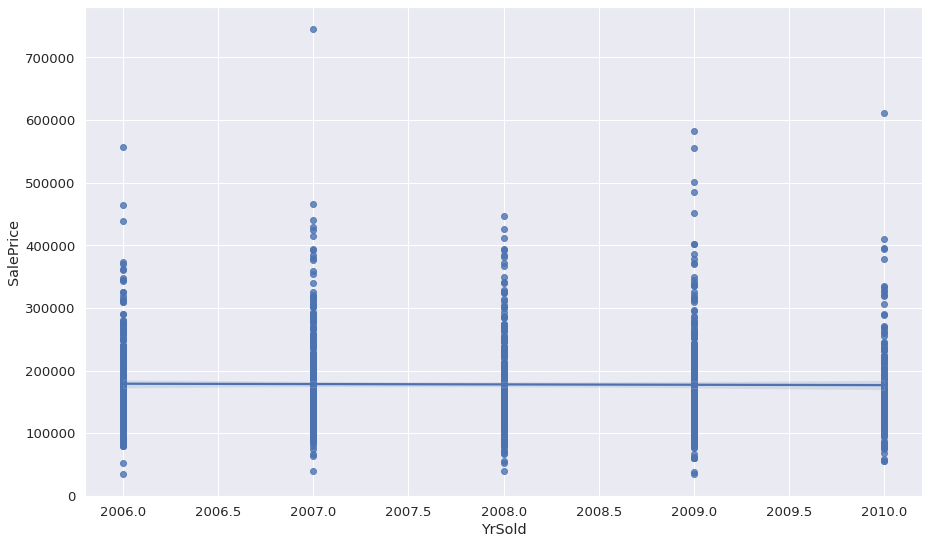

In [43]:
sns.regplot(x=clean_train["YrSold"], y=clean_train["SalePrice"])

As we can see There's an outlier in SalePrice

In [44]:
## remove outliers
q1 = clean_train["SalePrice"].quantile(0.25)
q3 = clean_train["SalePrice"].quantile(0.75)
iqr = q3-q1
min_wisk = q1 - 1.5 * iqr
max_wisk = q3 + 1.5 * iqr

In [45]:
clean_train = clean_train[  clean_train['SalePrice'].between(min_wisk, max_wisk)  ]
clean_train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,year_diff,Is_diff
0,1,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,...,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500,0,0
1,2,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,...,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500,0,0
2,3,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,...,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500,1,1
3,4,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,...,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000,55,1
4,5,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,...,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,...,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,0,8,2007,WD,Normal,175000,1,1
1456,1457,20,RL,85.0,13175,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,...,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,0,2,2010,WD,Normal,210000,10,1
1457,1458,70,RL,66.0,9042,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,...,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,2500,5,2010,WD,Normal,266500,65,1
1458,1459,20,RL,68.0,9717,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,...,FuseA,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,NaN,Attchd,1950.0,Unf,1,240,TA,TA,Y,366,0,112,0,0,0,0,4,2010,WD,Normal,142125,46,1


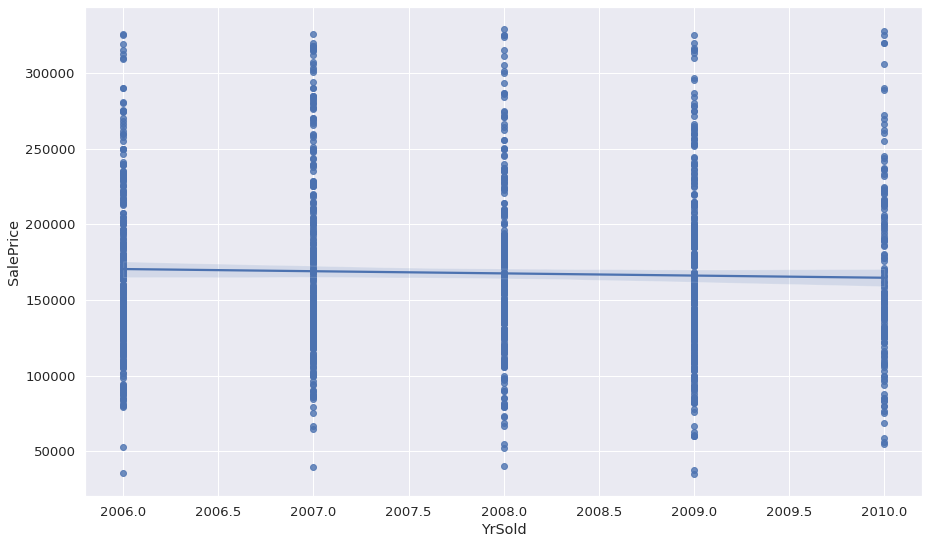

In [46]:
sns.regplot(x=clean_train["YrSold"], y=clean_train["SalePrice"])

In [47]:
clean_train['Condition1'].value_counts()

Norm      1147
Feedr       77
Artery      44
RRAn        23
PosN        16
RRAe        11
RRNn         5
PosA         5
RRNe         2
Name: Condition1, dtype: int64

In [48]:
clean_train['Condition2'].value_counts()

Norm      1318
Feedr        6
Artery       2
RRNn         2
PosA         1
RRAn         1
Name: Condition2, dtype: int64

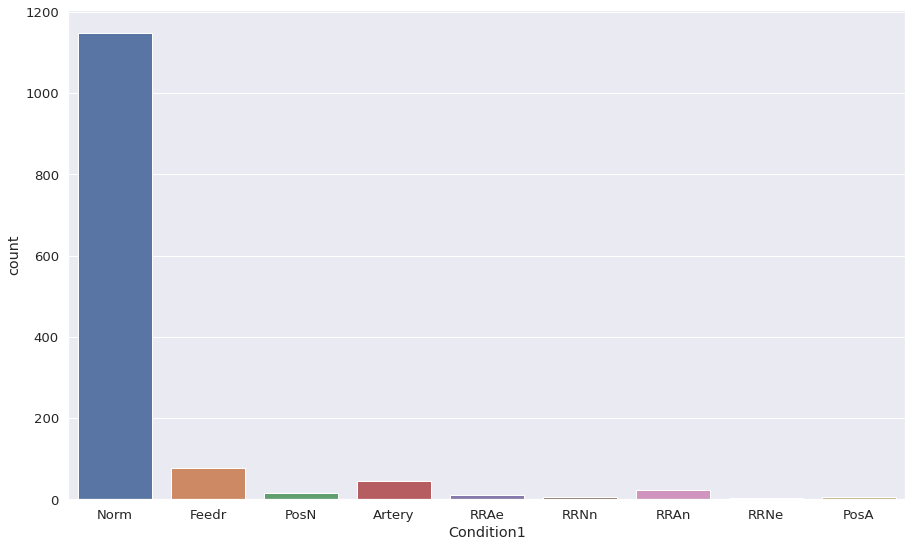

In [49]:
sns.countplot(x = "Condition1", data = clean_train)

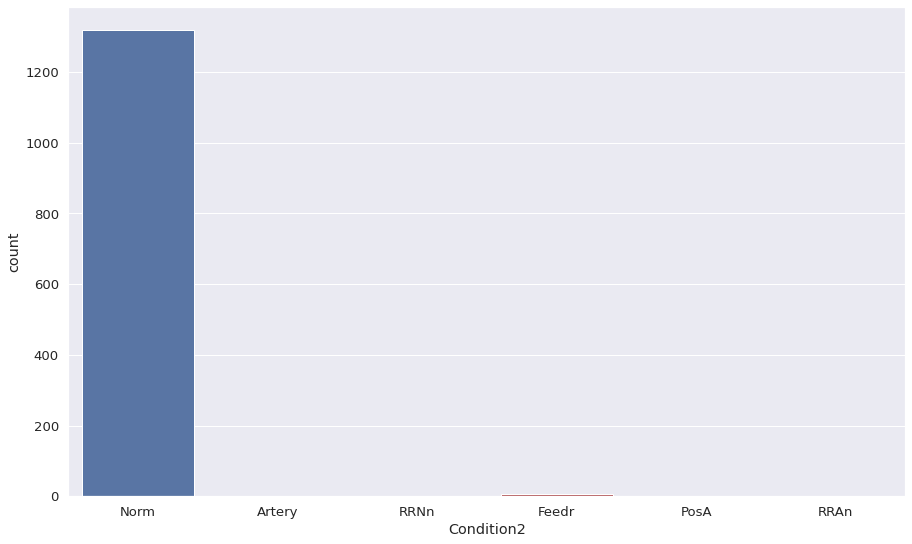

In [50]:
sns.countplot(x = "Condition2", data = clean_train)

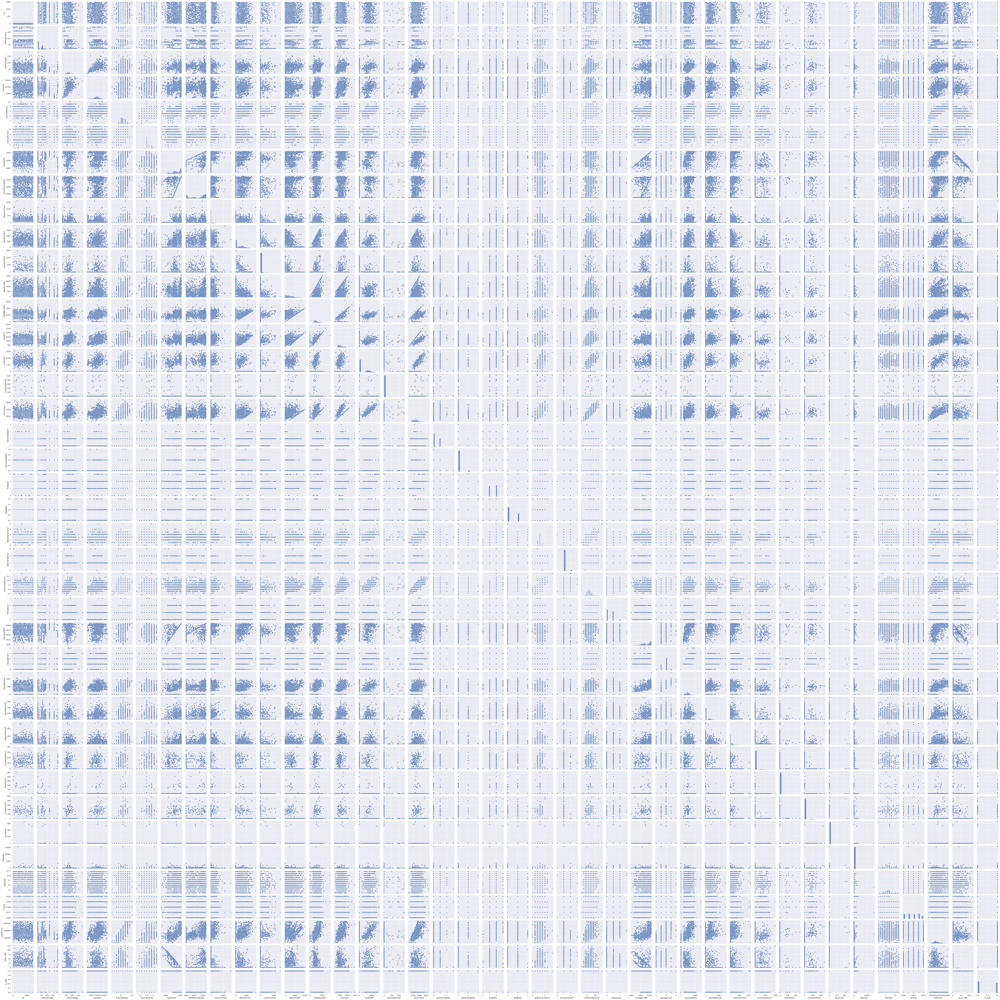

In [51]:
sns.pairplot(clean_train)

In [52]:
import plotly.express as px
fig = px.histogram(clean_train, x="SalePrice", color="YrSold", marginal='rug',hover_data=clean_train.columns)
fig.show()

In [53]:
# import plotly.express as px
fig = px.histogram(clean_train, x="SalePrice", color="MoSold", marginal='rug',hover_data=clean_train.columns)
fig.show()

We can see that the count of houses sold was on Month 6 and the most year houses sold was on 2010

In [ ]:
clean_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodD

In [54]:
# Now let's drop YearBuilt and YearRemodAdd since we got a column to express if they remod or not
clean_train.drop(['YearBuilt', 'YearRemodAdd'], axis=1, inplace = True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [55]:
## After that we can calculate the percentage of Bsmt Finished
clean_train['finish_percentage_of_Bsmt'] = (clean_train['BsmtFinSF1'] + clean_train['BsmtFinSF2'])/ clean_train['TotalBsmtSF']
clean_train['Unfinished_percentage_of_Bsmt'] = clean_train['BsmtUnfSF']/clean_train['TotalBsmtSF']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [56]:
clean_train.drop(['BsmtUnfSF', 'BsmtFinSF1', 'BsmtUnfSF'], axis=1, inplace = True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [57]:
clean_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinType2', 'BsmtFinSF2', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'Sc

In [58]:
clean_train.shape

(1330, 77)

## Is there's any relation between those two categorical values and which affects on SalePrice (condqual and overallqual)?


### - **Does it really mean overall quality have an overall good condition?**

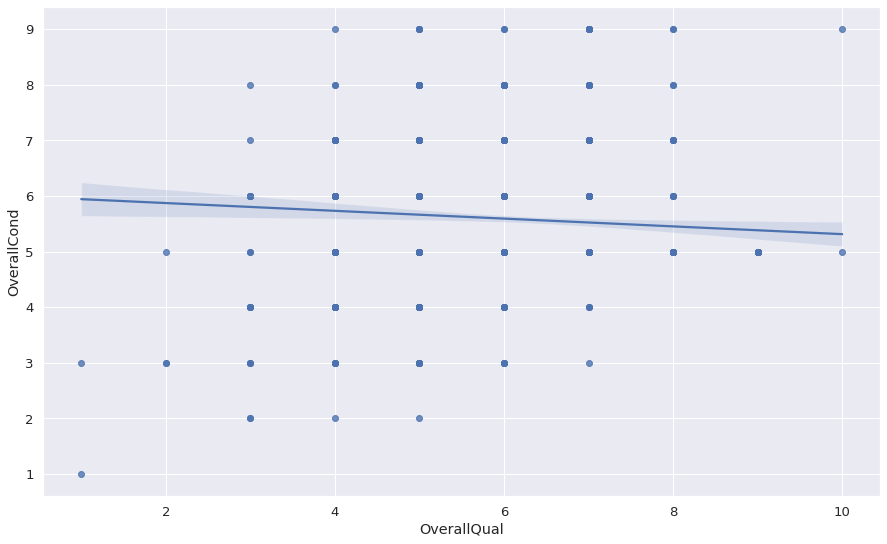

In [59]:
sns.regplot(x=clean_train["OverallQual"], y=clean_train["OverallCond"])

### - **Does it really mean that have an overall very good condition will have most sales?**

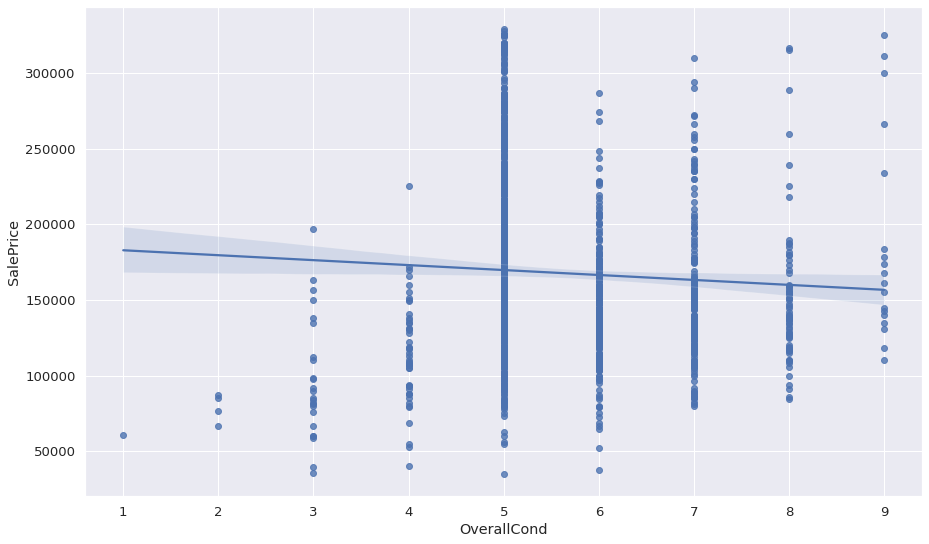

In [60]:
sns.regplot(x=clean_train["OverallCond"], y=clean_train["SalePrice"])

### - **Does it really Saleprice will be sold at high prices depending on an overallquality?**

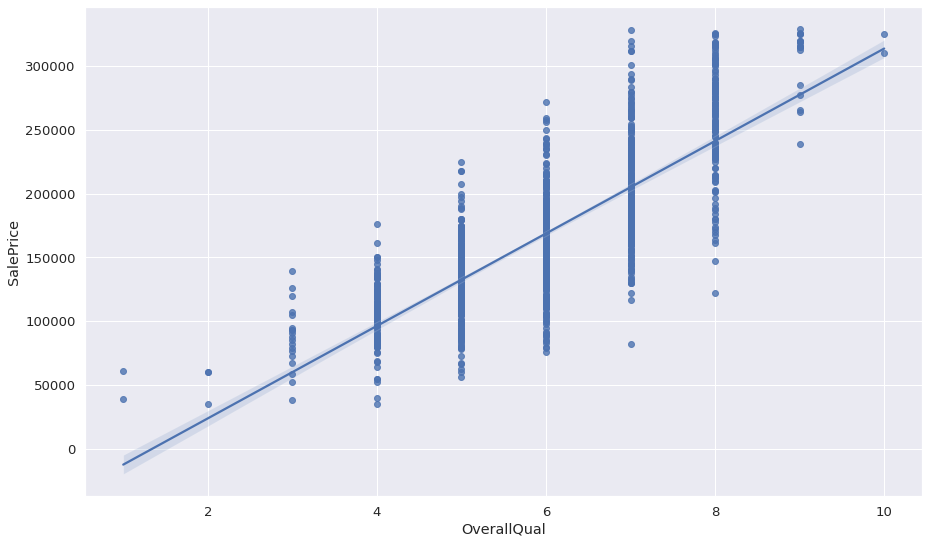

In [61]:
sns.regplot(x=clean_train["OverallQual"], y=clean_train["SalePrice"])

In [62]:
clean_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinType2', 'BsmtFinSF2', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'Sc

# **Is there any specific physical location that make our saleprice high?**

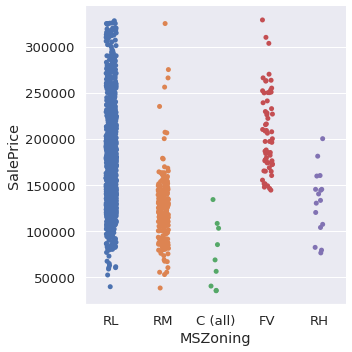

In [63]:
sns.catplot(x="MSZoning", y="SalePrice", data=clean_train)

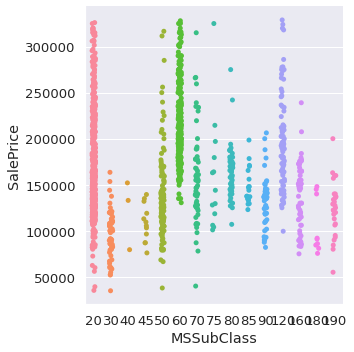

In [64]:
sns.catplot(x="MSSubClass", y="SalePrice", data=clean_train)

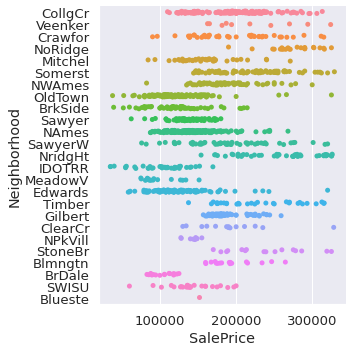

In [65]:
sns.catplot(x="SalePrice", y="Neighborhood", data=clean_train)

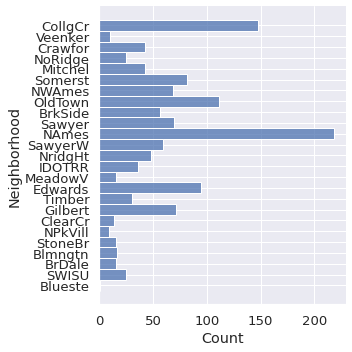

In [66]:
sns.displot(y = 'Neighborhood', data = clean_train)

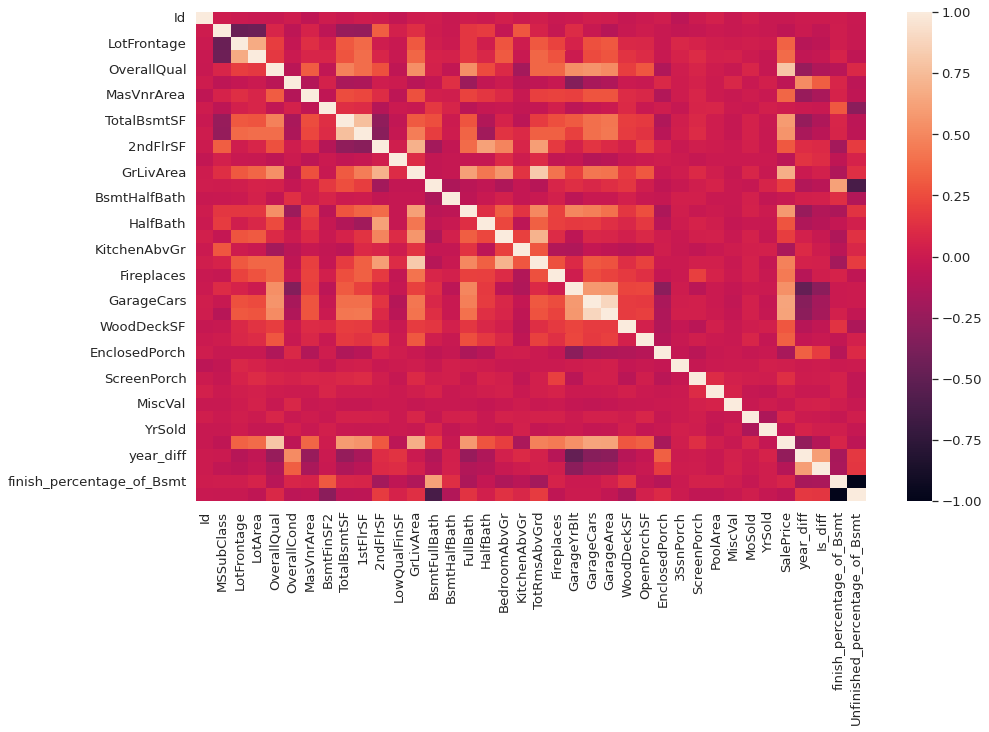

In [67]:
sns.heatmap(clean_train.corr())

In [68]:
clean_train.groupby('Neighborhood').describe()['SalePrice']

,count,mean,std,min,25%,50%,75%,max
Neighborhood,,,,,,,,
Blmngtn,17.0,194870.882353,30393.229219,159895.0,174000.0,191000.0,213490.0,264561.0
Blueste,1.0,151000.000000,NaN,151000.0,151000.0,151000.0,151000.0,151000.0
BrDale,16.0,104493.750000,14330.176493,83000.0,91000.0,106000.0,118000.0,125000.0
BrkSide,57.0,123103.070175,38473.366272,39300.0,100000.0,121600.0,140200.0,214500.0
ClearCr,14.0,193745.142857,49351.905344,130000.0,164375.0,190000.0,208250.0,328000.0
CollgCr,148.0,195175.851351,45660.170260,110000.0,151625.0,195950.0,224900.0,313000.0
Crawfor,43.0,195247.372093,54829.917748,90350.0,155950.0,188700.0,232000.0,315000.0
Edwards,95.0,124919.473684,40523.361593,58500.0,100000.0,119000.0,140000.0,320000.0
Gilbert,71.0,189142.830986,23186.865619,156932.0,174000.0,181000.0,193750.0,259000.0


In [69]:
clean_train.groupby('MSSubClass').describe()['SalePrice']

,count,mean,std,min,25%,50%,75%,max
MSSubClass,,,,,,,,
20,483.0,170629.140787,56397.589364,35311.0,130125.0,155000.0,204450.0,326000.0
30,67.0,95809.716418,25085.954453,34900.0,81250.0,99900.0,110250.0,163500.0
40,3.0,121500.000000,37593.217473,79500.0,106250.0,133000.0,142500.0,152000.0
45,12.0,108591.666667,20231.723889,76000.0,94125.0,107500.0,122250.0,139400.0
50,137.0,137278.306569,44170.935470,37900.0,112000.0,130500.0,149000.0,316600.0
60,253.0,217460.505929,44914.856160,130500.0,183000.0,210000.0,250000.0,328000.0
70,56.0,159649.017857,51451.607502,40000.0,127750.0,154287.5,178625.0,315000.0
75,13.0,159538.461538,61530.636522,101000.0,118500.0,144000.0,179500.0,325000.0
80,53.0,163600.943396,27189.793211,107000.0,146800.0,164500.0,175000.0,275000.0


In [70]:
clean_train.groupby('MSZoning').describe()['SalePrice']

,count,mean,std,min,25%,50%,75%,max
MSZoning,,,,,,,,
C (all),9.0,73808.888889,35759.614502,34900.0,40000.00,68400.0,102776.0,133900.0
FV,62.0,207423.967742,43709.982987,144152.0,173799.75,198450.0,240500.0,328900.0
RH,16.0,131558.375000,35714.118435,76000.0,106150.00,136500.0,148608.5,200000.0
RL,1030.0,176102.956311,56346.606483,39300.0,135000.00,167500.0,210000.0,328000.0
RM,213.0,122866.521127,36685.889631,37900.0,100000.00,120000.0,140000.0,325000.0


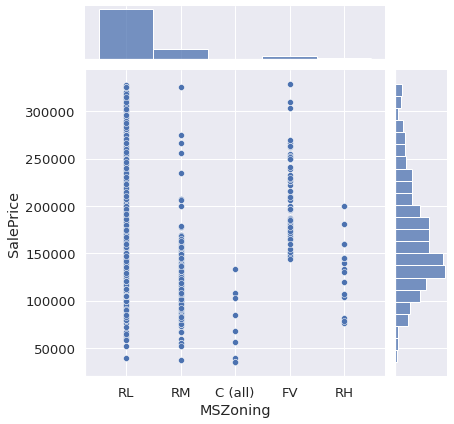

In [71]:
sns.jointplot(x= 'MSZoning', y = 'SalePrice', data = clean_train)

- RL is the safest place where we can find all types of saleprice from low to high

- FV is a bit more risky with highest SalePrice

**BUT**

What's my insight? We have like +1k row that containing RL so we have a good info about all the prices included in that place While we have much more less data in FV... So Is that insight for real we may need more data

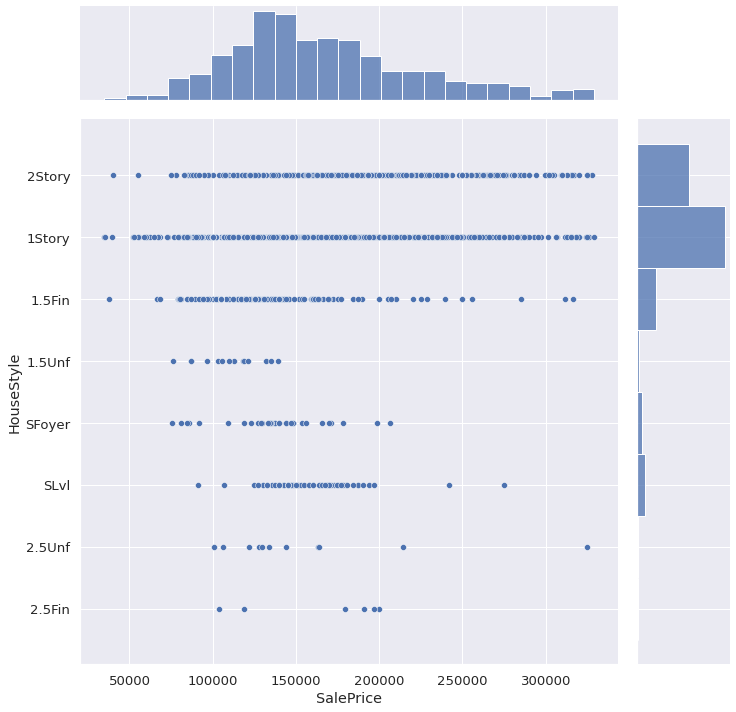

In [72]:
# fig, ax = plt.figure(figsize=(20, 10))
sns.jointplot(x= 'SalePrice', y = 'HouseStyle', data = clean_train, height = 10)

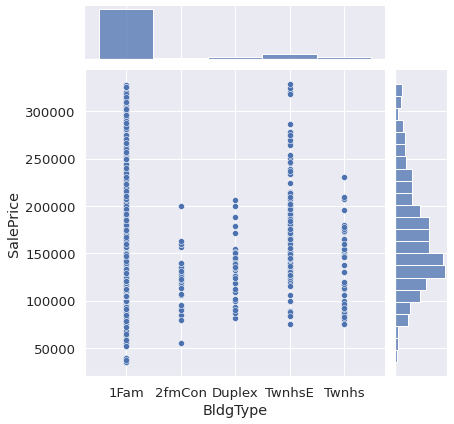

In [73]:
sns.jointplot(x= 'BldgType', y = 'SalePrice', data = clean_train)

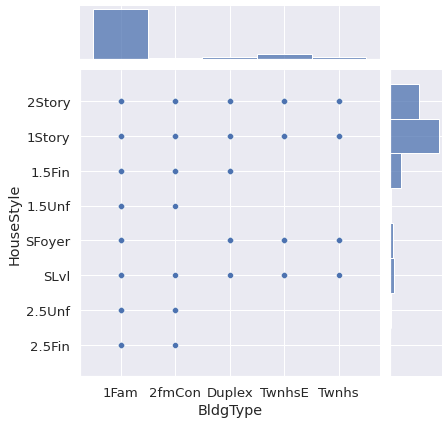

In [74]:
sns.jointplot(x= 'BldgType', y = 'HouseStyle', data = clean_train)

In [75]:
clean_train['Condition1'].value_counts()

Norm      1147
Feedr       77
Artery      44
RRAn        23
PosN        16
RRAe        11
RRNn         5
PosA         5
RRNe         2
Name: Condition1, dtype: int64

In [76]:
clean_train['Condition2'].value_counts()

Norm      1318
Feedr        6
Artery       2
RRNn         2
PosA         1
RRAn         1
Name: Condition2, dtype: int64

In [77]:
clean_train['BldgType'].value_counts()

1Fam      1099
TwnhsE     110
Duplex      50
Twnhs       43
2fmCon      28
Name: BldgType, dtype: int64

In [78]:
clean_train['Utilities'].value_counts()

AllPub    1329
NoSeWa       1
Name: Utilities, dtype: int64

In [79]:
clean_train['LotShape'].value_counts()

Reg    870
IR1    429
IR2     26
IR3      5
Name: LotShape, dtype: int64

In [80]:
clean_train['LotConfig'].value_counts()

Inside     970
Corner     242
CulDSac     72
FR2         42
FR3          4
Name: LotConfig, dtype: int64

In [81]:
clean_train['LandContour'].value_counts()

Lvl    1220
Bnk      56
HLS      34
Low      20
Name: LandContour, dtype: int64

In [82]:
clean_train['LandSlope'].value_counts()

Gtl    1276
Mod      51
Sev       3
Name: LandSlope, dtype: int64

In [83]:
clean_train['PoolArea'].value_counts()

0      1327
648       1
576       1
519       1
Name: PoolArea, dtype: int64

In [84]:
clean_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinType2', 'BsmtFinSF2', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'Sc

In [85]:
clean_train['MSZoning'] = clean_train['MSZoning'].apply(lambda x: x if ((x== 'RL') | (x == 'RM')) else 'Other')
clean_train['Condition1'] = clean_train['Condition1'].apply(lambda x:"Norm" if x== 'Norm' else "Other")
clean_train['Condition2'] = clean_train['Condition1'].apply(lambda x:"Norm" if x== 'Norm' else "Other")
clean_train['BldgType'] = clean_train['BldgType'].apply(lambda x:"1Fam" if x== '1Fam' else "Other")
clean_train['LotShape'] = clean_train['LotShape'].apply(lambda x: x if ((x== 'Reg') | (x == 'IR1')) else 'Other')
clean_train['LotConfig'] = clean_train['LotConfig'].apply(lambda x: x if ((x== 'Inside') | (x == 'corner')) else 'Other')
clean_train['LandContour'] = clean_train['LandContour'].apply(lambda x:"Lvl" if x== 'Lvl' else "Other")
clean_train['LandSlope'] = clean_train['LandSlope'].apply(lambda x:"Gtl" if x== 'Gtl' else "Other")
clean_train['PoolArea'] = clean_train['PoolArea'].apply(lambda x:0 if x== 0 else 1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

In [86]:
clean_train['RoofStyle'].value_counts()

Gable      1076
Hip         231
Gambrel      11
Mansard       7
Flat          5
Name: RoofStyle, dtype: int64

In [87]:
clean_train['ExterQual'].value_counts()

TA    857
Gd    440
Ex     20
Fa     13
Name: ExterQual, dtype: int64

In [88]:
clean_train['BsmtCond'].value_counts()

TA    1190
Gd      57
Fa      45
Po       2
Name: BsmtCond, dtype: int64

In [89]:
clean_train['BsmtQual'].value_counts()

TA    618
Gd    571
Ex     70
Fa     35
Name: BsmtQual, dtype: int64

In [90]:
clean_train['SaleType'].value_counts()

WD       1177
New        86
COD        41
ConLD       8
ConLw       5
ConLI       4
CWD         4
Oth         3
Con         2
Name: SaleType, dtype: int64

In [91]:
clean_train['RoofStyle'] = clean_train['RoofStyle'].apply(lambda x: x if ((x== 'Gable') | (x == 'Hip')) else "Other")
clean_train['ExterQual'] = clean_train['ExterQual'].apply(lambda x: x if ((x== 'TA') | (x == 'Gd')) else "Other")
clean_train['BsmtCond'] = clean_train['BsmtCond'].apply(lambda x:"TA" if x== 'TA' else "Other")
clean_train['BsmtQual'] = clean_train['BsmtQual'].apply(lambda x: x if ((x== 'TA') | (x == 'Gd')) else "Other")
clean_train['SaleType'] = clean_train['SaleType'].apply(lambda x:"WD" if x== 'WD' else "Other")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

In [92]:
clean_train['SaleCondition'].value_counts()

Normal     1114
Abnorml      95
Partial      88
Family       20
Alloca        9
AdjLand       4
Name: SaleCondition, dtype: int64

In [93]:
clean_train['FireplaceQu'].value_counts()

Gd    310
TA    279
Fa     32
Po     19
Ex     12
Name: FireplaceQu, dtype: int64

In [94]:
clean_train['SaleCondition'] = clean_train['SaleCondition'].apply(lambda x:"Normal" if x== 'Normal' else "Other")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [95]:
clean_train.drop(['FireplaceQu'], axis=1, inplace = True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [96]:
clean_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1330 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Id                             1330 non-null   int64  
 1   MSSubClass                     1330 non-null   int64  
 2   MSZoning                       1330 non-null   object 
 3   LotFrontage                    1101 non-null   float64
 4   LotArea                        1330 non-null   int64  
 5   Street                         1330 non-null   object 
 6   LotShape                       1330 non-null   object 
 7   LandContour                    1330 non-null   object 
 8   Utilities                      1330 non-null   object 
 9   LotConfig                      1330 non-null   object 
 10  LandSlope                      1330 non-null   object 
 11  Neighborhood                   1330 non-null   object 
 12  Condition1                     1330 non-null   o

In [97]:
clean_train['LotFrontage'].dtypes

dtype('float64')

In [98]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors = 2)
df_filled = imputer.fit_transform(clean_train[['LotFrontage']])
df_filled

array([[65.],
       [80.],
       [68.],
       ...,
       [66.],
       [68.],
       [75.]])

In [99]:
df_filled.shape

(1330, 1)

In [100]:
df_filled= pd.DataFrame(df_filled)

In [101]:
df_filled.head()

,0
0,65.0
1,80.0
2,68.0
3,60.0
4,84.0


In [102]:
df_filled[0]

0       65.0
1       80.0
2       68.0
3       60.0
4       84.0
        ... 
1325    62.0
1326    85.0
1327    66.0
1328    68.0
1329    75.0
Name: 0, Length: 1330, dtype: float64

In [103]:
# entry = df_filled[0]
combined_clean_train = pd.concat([clean_train, df_filled], axis=1)
combined_clean_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtFinSF2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,year_diff,Is_diff,finish_percentage_of_Bsmt,Unfinished_percentage_of_Bsmt,0
0,1.0,60.0,RL,65.0,8450.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7.0,5.0,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,0.0,856.0,GasA,Ex,Y,SBrkr,856.0,854.0,0.0,1710.0,1.0,0.0,2.0,1.0,3.0,1.0,Gd,8.0,Typ,0.0,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0.0,61.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0,WD,Normal,208500.0,0.0,0.0,0.824766,0.175234,65.0
1,2.0,20.0,RL,80.0,9600.0,Pave,Reg,Lvl,AllPub,Other,Gtl,Veenker,Other,Other,1Fam,1Story,6.0,8.0,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,0.0,1262.0,GasA,Ex,Y,SBrkr,1262.0,0.0,0.0,1262.0,0.0,1.0,2.0,0.0,3.0,1.0,TA,6.0,Typ,1.0,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,298.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,WD,Normal,181500.0,0.0,0.0,0.774960,0.225040,80.0
2,3.0,60.0,RL,68.0,11250.0,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7.0,5.0,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,0.0,920.0,GasA,Ex,Y,SBrkr,920.0,866.0,0.0,1786.0,1.0,0.0,2.0,1.0,3.0,1.0,Gd,6.0,Typ,1.0,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0.0,42.0,0.0,0.0,0.0,0.0,0.0,9.0,2008.0,WD,Normal,223500.0,1.0,1.0,0.528261,0.471739,68.0
3,4.0,70.0,RL,60.0,9550.0,Pave,IR1,Lvl,AllPub,Other,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7.0,5.0,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Other,No,ALQ,Unf,0.0,756.0,GasA,Gd,Y,SBrkr,961.0,756.0,0.0,1717.0,1.0,0.0,1.0,0.0,3.0,1.0,Gd,7.0,Typ,1.0,Detchd,1998.0,Unf,3.0,642.0,TA,TA,Y,0.0,35.0,272.0,0.0,0.0,0.0,0.0,2.0,2006.0,WD,Other,140000.0,55.0,1.0,0.285714,0.714286,60.0
4,5.0,60.0,RL,84.0,14260.0,Pave,IR1,Lvl,AllPub,Other,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8.0,5.0,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,0.0,1145.0,GasA,Ex,Y,SBrkr,1145.0,1053.0,0.0,2198.0,1.0,0.0,2.0,1.0,4.0,1.0,Gd,9.0,Typ,1.0,Attchd,2000.0,RFn,3.0,836.0,TA,TA,Y,192.0,84.0,0.0,0.0,0.0,0.0,0.0,12.0,2008.0,WD,Normal,250000.0,0.0,0.0,0.572052,0.427948,84.0


In [104]:
## now we will rename 0 column into LotFrontage and drop old one
combined_clean_train.drop(['LotFrontage'], axis=1, inplace = True)

In [105]:
combined_clean_train.rename(columns={0: 'LotFrontage'}, inplace = True)

In [106]:
combined_clean_train['LotFrontage'].isna().sum()

118

In [107]:
combined_clean_train.dropna(inplace=True)

In [108]:
combined_clean_train['LotFrontage'].isna().sum()

0

In [109]:
combined_clean_train.shape

(1102, 76)

In [110]:
combined_clean_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1102 entries, 0 to 1329
Data columns (total 76 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Id                             1102 non-null   float64
 1   MSSubClass                     1102 non-null   float64
 2   MSZoning                       1102 non-null   object 
 3   LotArea                        1102 non-null   float64
 4   Street                         1102 non-null   object 
 5   LotShape                       1102 non-null   object 
 6   LandContour                    1102 non-null   object 
 7   Utilities                      1102 non-null   object 
 8   LotConfig                      1102 non-null   object 
 9   LandSlope                      1102 non-null   object 
 10  Neighborhood                   1102 non-null   object 
 11  Condition1                     1102 non-null   object 
 12  Condition2                     1102 non-null   o

In [111]:
combined_clean_train["Condition_all"]= combined_clean_train[["Condition1","Condition2"]].apply(lambda x: "Norm" if (x.Condition1 == "Norm" and x.Condition2 == "Norm") else "Mixed" if (x.Condition1 == "Norm" and x.Condition2 != "Norm") else ("Mixed" if (x.Condition1 != "Norm" and x.Condition2 == "Norm") else "Other"), axis=1)
combined_clean_train["Condition_all"]

0        Norm
1       Other
2        Norm
3        Norm
4        Norm
        ...  
1322     Norm
1324     Norm
1327     Norm
1328     Norm
1329     Norm
Name: Condition_all, Length: 1102, dtype: object

In [112]:
combined_clean_train[(combined_clean_train.Condition1 == 'Norm') & (combined_clean_train.Condition2 != 'Norm')]

,Id,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtFinSF2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,year_diff,Is_diff,finish_percentage_of_Bsmt,Unfinished_percentage_of_Bsmt,LotFrontage,Condition_all


In [113]:
combined_clean_train[(combined_clean_train.Condition1 != 'Norm') & (combined_clean_train.Condition2 == 'Norm')]

,Id,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtFinSF2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,year_diff,Is_diff,finish_percentage_of_Bsmt,Unfinished_percentage_of_Bsmt,LotFrontage,Condition_all


In [114]:
combined_clean_train["Condition_all"].value_counts()

Norm     955
Other    147
Name: Condition_all, dtype: int64

In [115]:
combined_clean_train.drop(['Condition1', 'Condition2'], axis=1, inplace = True)
combined_clean_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotArea', 'Street', 'LotShape',
       'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood',
       'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'BsmtFinSF2',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'Sa

In [116]:
combined_clean_train.shape

(1102, 75)

**What we are doing is trying to minimize categorical values for each column and replace values then we will apply get_dummies on dataset and then apply train test split and see what's coming after that** 

**We won't use imblearn as we are predicting price not categorical value we won't also stratify y as we said we are not predicting categorical values as y is SalePrice**

In [117]:
combined_clean_train["LandContour"].value_counts()

Lvl      1019
Other      83
Name: LandContour, dtype: int64

In [118]:
combined_clean_train["Utilities"].value_counts()

AllPub    1101
NoSeWa       1
Name: Utilities, dtype: int64

In [119]:
combined_clean_train["LotConfig"].value_counts()

Inside    792
Other     310
Name: LotConfig, dtype: int64

In [120]:
combined_clean_train["LotShape"].value_counts()

Reg      697
IR1      377
Other     28
Name: LotShape, dtype: int64

In [121]:
combined_clean_train["Street"].value_counts()

Pave    1100
Grvl       2
Name: Street, dtype: int64

In [122]:
combined_clean_train["LandSlope"].value_counts()

Gtl      1058
Other      44
Name: LandSlope, dtype: int64

In [123]:
combined_clean_train["RoofStyle"].value_counts()

Gable    881
Hip      203
Other     18
Name: RoofStyle, dtype: int64

In [124]:
combined_clean_train["RoofMatl"].value_counts()

CompShg    1092
WdShake       4
Tar&Grv       3
WdShngl       2
Roll          1
Name: RoofMatl, dtype: int64

In [125]:
combined_clean_train["Exterior1st"].value_counts()

VinylSd    396
HdBoard    186
MetalSd    173
Wd Sdng    153
Plywood     78
BrkFace     35
CemntBd     33
Stucco      15
WdShing     15
AsbShng     14
Stone        2
BrkComm      1
ImStucc      1
Name: Exterior1st, dtype: int64

In [126]:
combined_clean_train["Exterior2nd"].value_counts()

VinylSd    387
HdBoard    172
MetalSd    171
Wd Sdng    148
Plywood     99
CmentBd     32
Wd Shng     25
BrkFace     19
Stucco      17
AsbShng     14
ImStucc      8
Brk Cmn      6
AsphShn      2
Other        1
Stone        1
Name: Exterior2nd, dtype: int64

In [127]:
combined_clean_train["MasVnrType"].value_counts()

None       646
BrkFace    358
Stone       86
BrkCmn      12
Name: MasVnrType, dtype: int64

In [128]:
combined_clean_train["BldgType"].value_counts()

1Fam     930
Other    172
Name: BldgType, dtype: int64

In [129]:
combined_clean_train["HouseStyle"].value_counts()

1Story    550
2Story    341
1.5Fin    108
SLvl       54
SFoyer     26
1.5Unf     10
2.5Unf     10
2.5Fin      3
Name: HouseStyle, dtype: int64

In [130]:
combined_clean_train["ExterQual"].value_counts()

TA       688
Gd       391
Other     23
Name: ExterQual, dtype: int64

In [131]:
combined_clean_train["ExterCond"].value_counts()

TA    974
Gd    111
Fa     15
Ex      2
Name: ExterCond, dtype: int64

In [132]:
combined_clean_train["Foundation"].value_counts()

PConc     495
CBlock    495
BrkTil    104
Stone       5
Wood        3
Name: Foundation, dtype: int64

In [133]:
combined_clean_train["BsmtQual"].value_counts()

TA       508
Gd       502
Other     92
Name: BsmtQual, dtype: int64

In [134]:
combined_clean_train["BsmtCond"].value_counts()

TA       1018
Other      84
Name: BsmtCond, dtype: int64

In [135]:
combined_clean_train["BsmtExposure"].value_counts()

No    774
Av    168
Mn     89
Gd     71
Name: BsmtExposure, dtype: int64

In [136]:
combined_clean_train["BsmtFinType1"].value_counts()

Unf    329
GLQ    301
ALQ    183
BLQ    120
Rec    109
LwQ     60
Name: BsmtFinType1, dtype: int64

In [137]:
combined_clean_train["BsmtFinType2"].value_counts()

Unf    968
LwQ     42
Rec     37
BLQ     29
ALQ     16
GLQ     10
Name: BsmtFinType2, dtype: int64

In [138]:
combined_clean_train["Heating"].value_counts()

GasA    1086
GasW      13
Grav       2
OthW       1
Name: Heating, dtype: int64

In [139]:
combined_clean_train["HeatingQC"].value_counts()

Ex    556
TA    324
Gd    191
Fa     30
Po      1
Name: HeatingQC, dtype: int64

In [140]:
combined_clean_train["CentralAir"].value_counts()

Y    1049
N      53
Name: CentralAir, dtype: int64

In [141]:
combined_clean_train["Electrical"].value_counts()

SBrkr    1015
FuseA      69
FuseF      15
FuseP       2
Mix         1
Name: Electrical, dtype: int64

In [142]:
combined_clean_train["KitchenQual"].value_counts()

TA    558
Gd    474
Ex     50
Fa     20
Name: KitchenQual, dtype: int64

In [143]:
combined_clean_train["Functional"].value_counts()

Typ     1034
Min2      26
Min1      20
Maj1      10
Mod        8
Maj2       4
Name: Functional, dtype: int64

In [144]:
combined_clean_train["GarageType"].value_counts()

Attchd     699
Detchd     320
BuiltIn     57
Basment     16
CarPort      6
2Types       4
Name: GarageType, dtype: int64

In [147]:
# def Ext_condition(x, y):
#   if x == y

# BsmtFinType2, BsmtFinType1
# combined_clean_train["Exterior_Cond"]= combined_clean_train[["Exterior1st","Exterior2nd"]].apply(lambda x: "VinylSd" if (x.Exterior1st == "VinylSd" and x.Exterior2nd == "VinylSd")else "HdBoard" if (x.Exterior1st == "HdBoard" and x.Exterior2nd == "HdBoard")else "MetalSd" if (x.Exterior1st == "MetalSd" and x.Exterior2nd == "MetalSd")else "Wd Sdng" if (x.Exterior1st == "Wd Sdng" and x.Exterior2nd == "Wd Sdng")else "Plywood" if (x.Exterior1st == "Plywood" and x.Exterior2nd == "Plywood")else "Other"), axis=1))

In [145]:
combined_clean_train["GarageFinish"].value_counts()

Unf    505
RFn    349
Fin    248
Name: GarageFinish, dtype: int64

In [146]:
combined_clean_train["GarageQual"].value_counts()

TA    1047
Fa      39
Gd      11
Po       3
Ex       2
Name: GarageQual, dtype: int64

In [148]:
combined_clean_train["GarageCond"].value_counts()

TA    1058
Fa      28
Gd       8
Po       6
Ex       2
Name: GarageCond, dtype: int64

In [149]:
combined_clean_train["PavedDrive"].value_counts()

Y    1040
N      41
P      21
Name: PavedDrive, dtype: int64

In [150]:
combined_clean_train["SaleType"].value_counts()

WD       972
Other    130
Name: SaleType, dtype: int64

In [151]:
combined_clean_train["SaleCondition"].value_counts()

Normal    926
Other     176
Name: SaleCondition, dtype: int64

In [152]:
combined_clean_train["RoofMatl"] = combined_clean_train["RoofMatl"].apply(lambda x:"CompShg" if x== 'CompShg' else "Other")
combined_clean_train["Exterior1st"] = combined_clean_train["Exterior1st"].apply(lambda x: x if ((x== 'VinylSd') | (x == 'HdBoard')| (x == 'MetalSd')| (x == 'Wd Sdng')| (x == 'Plywood')) else "Other")
combined_clean_train["Exterior2nd"] = combined_clean_train["Exterior2nd"].apply(lambda x: x if ((x== 'VinylSd') | (x == 'HdBoard')| (x == 'MetalSd')| (x == 'Wd Sdng')| (x == 'Plywood')) else "Other")
combined_clean_train["MasVnrType"] = combined_clean_train["MasVnrType"].apply(lambda x: x if ((x== 'None') | (x == 'BrkFace')) else "Other")
combined_clean_train["HouseStyle"] = combined_clean_train["HouseStyle"].apply(lambda x: x if ((x== '1Story') | (x == '2Story')| (x == '1.5Fin')) else "Other")
combined_clean_train["ExterCond"] = combined_clean_train["ExterCond"].apply(lambda x: x if ((x== 'TA') | (x == 'Gd')) else "Other")
combined_clean_train["Foundation"] = combined_clean_train["ExterCond"].apply(lambda x: x if ((x== 'PConc') | (x == 'CBlock')|(x == 'BrkTil')) else "Other")
combined_clean_train["Bsmt Exposure"] = combined_clean_train["BsmtExposure"].apply(lambda x: x if ((x== 'No') | (x == 'Av')) else "Other")
combined_clean_train["Heating"] = combined_clean_train["Heating"].apply(lambda x: x if ((x== 'GasA')) else "Other")
combined_clean_train["HeatingQC"] = combined_clean_train["HeatingQC"].apply(lambda x: x if (( x== 'Ex')|(x == 'TA')| (x == 'Gd')) else "Other")
combined_clean_train["Electrical"] = combined_clean_train["Electrical"].apply(lambda x: x if ((x== 'SBrkr')) else "Other")
combined_clean_train["KitchenQual"] = combined_clean_train["KitchenQual"].apply(lambda x: x if (( x== 'TA')|(x == 'Gd')) else "Other")
combined_clean_train["Functional"] = combined_clean_train["Functional"].apply(lambda x: x if (( x== 'Typ')) else "Other")
combined_clean_train["GarageType"] = combined_clean_train["GarageType"].apply(lambda x: x if (( x== 'Attchd')|(x == 'Detchd')) else "Other")
combined_clean_train["GarageQual"] = combined_clean_train["GarageQual"].apply(lambda x: x if (( x== 'TA')) else "Other")
combined_clean_train["GarageCond"] = combined_clean_train["GarageCond"].apply(lambda x: x if (( x== 'TA')) else "Other")

In [153]:
combined_clean_train["Neighborhood"].value_counts()

NAmes      183
CollgCr    126
OldTown     87
Somerst     70
Gilbert     65
Sawyer      64
NWAmes      61
Edwards     58
SawyerW     50
NridgHt     46
BrkSide     40
Crawfor     38
Mitchel     36
Timber      27
IDOTRR      26
NoRidge     24
SWISU       17
StoneBr     15
Blmngtn     15
ClearCr     13
BrDale      13
Veenker     10
MeadowV     10
NPkVill      7
Blueste      1
Name: Neighborhood, dtype: int64

In [154]:
combined_clean_train.head()

,Id,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtFinSF2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,year_diff,Is_diff,finish_percentage_of_Bsmt,Unfinished_percentage_of_Bsmt,LotFrontage,Condition_all,Bsmt Exposure
0,1.0,60.0,RL,8450.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,1Fam,2Story,7.0,5.0,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,Other,Gd,TA,No,GLQ,Unf,0.0,856.0,GasA,Ex,Y,SBrkr,856.0,854.0,0.0,1710.0,1.0,0.0,2.0,1.0,3.0,1.0,Gd,8.0,Typ,0.0,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0.0,61.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0,WD,Normal,208500.0,0.0,0.0,0.824766,0.175234,65.0,Norm,No
1,2.0,20.0,RL,9600.0,Pave,Reg,Lvl,AllPub,Other,Gtl,Veenker,1Fam,1Story,6.0,8.0,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,Other,Gd,TA,Gd,ALQ,Unf,0.0,1262.0,GasA,Ex,Y,SBrkr,1262.0,0.0,0.0,1262.0,0.0,1.0,2.0,0.0,3.0,1.0,TA,6.0,Typ,1.0,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,298.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,WD,Normal,181500.0,0.0,0.0,0.774960,0.225040,80.0,Other,Other
2,3.0,60.0,RL,11250.0,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,1Fam,2Story,7.0,5.0,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,Other,Gd,TA,Mn,GLQ,Unf,0.0,920.0,GasA,Ex,Y,SBrkr,920.0,866.0,0.0,1786.0,1.0,0.0,2.0,1.0,3.0,1.0,Gd,6.0,Typ,1.0,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0.0,42.0,0.0,0.0,0.0,0.0,0.0,9.0,2008.0,WD,Normal,223500.0,1.0,1.0,0.528261,0.471739,68.0,Norm,Other
3,4.0,70.0,RL,9550.0,Pave,IR1,Lvl,AllPub,Other,Gtl,Crawfor,1Fam,2Story,7.0,5.0,Gable,CompShg,Wd Sdng,Other,None,0.0,TA,TA,Other,TA,Other,No,ALQ,Unf,0.0,756.0,GasA,Gd,Y,SBrkr,961.0,756.0,0.0,1717.0,1.0,0.0,1.0,0.0,3.0,1.0,Gd,7.0,Typ,1.0,Detchd,1998.0,Unf,3.0,642.0,TA,TA,Y,0.0,35.0,272.0,0.0,0.0,0.0,0.0,2.0,2006.0,WD,Other,140000.0,55.0,1.0,0.285714,0.714286,60.0,Norm,No
4,5.0,60.0,RL,14260.0,Pave,IR1,Lvl,AllPub,Other,Gtl,NoRidge,1Fam,2Story,8.0,5.0,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,Other,Gd,TA,Av,GLQ,Unf,0.0,1145.0,GasA,Ex,Y,SBrkr,1145.0,1053.0,0.0,2198.0,1.0,0.0,2.0,1.0,4.0,1.0,Gd,9.0,Typ,1.0,Attchd,2000.0,RFn,3.0,836.0,TA,TA,Y,192.0,84.0,0.0,0.0,0.0,0.0,0.0,12.0,2008.0,WD,Normal,250000.0,0.0,0.0,0.572052,0.427948,84.0,Norm,Av


**We also need to rename columns to more identifying name**

In [155]:
combined_clean_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotArea', 'Street', 'LotShape',
       'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood',
       'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'BsmtFinSF2',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'Sa

In [156]:
combined_clean_train.rename({'MSSubClass':'dwelling_involved_type',
                             'MSZoning':'general_zoning_classification',
                             'LotArea' : 'Total_area', 
                             'Street':'type_of_road', 
                             'LotShape':'property_general_shape', 
                             'LandContour':'property_Flatness', 
                             'Utilities':'utilities_types', 
                             'BldgType':'dwelling_type', 
                             'RoofMatl':'roof_material', 
                             'Exterior1st':'exterior_covering_1', 
                             'Exterior2nd':'exterior_covering_2', 
                             'MasVnrType':'masonry_veneer_type',
                             'Electrical':'electrical_system', 
                             'TotRmsAbvGrd':'total_rooms_above_grade', 
                             'GarageFinish':'interior_finish_garage',
                             'GarageCars':'garage_car_capacity',
                             '3SsnPorch':'three_season_porch_area',
                             'MiscFeature':'other_features',
                             'MiscVal':'other_features_values'
                             }, axis='columns', inplace = True)

In [157]:
combined_clean_train.head()

,Id,dwelling_involved_type,general_zoning_classification,Total_area,type_of_road,property_general_shape,property_Flatness,utilities_types,LotConfig,LandSlope,Neighborhood,dwelling_type,HouseStyle,OverallQual,OverallCond,RoofStyle,roof_material,exterior_covering_1,exterior_covering_2,masonry_veneer_type,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtFinSF2,TotalBsmtSF,Heating,HeatingQC,CentralAir,electrical_system,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,total_rooms_above_grade,Functional,Fireplaces,GarageType,GarageYrBlt,interior_finish_garage,garage_car_capacity,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,three_season_porch_area,ScreenPorch,PoolArea,other_features_values,MoSold,YrSold,SaleType,SaleCondition,SalePrice,year_diff,Is_diff,finish_percentage_of_Bsmt,Unfinished_percentage_of_Bsmt,LotFrontage,Condition_all,Bsmt Exposure
0,1.0,60.0,RL,8450.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,1Fam,2Story,7.0,5.0,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,Other,Gd,TA,No,GLQ,Unf,0.0,856.0,GasA,Ex,Y,SBrkr,856.0,854.0,0.0,1710.0,1.0,0.0,2.0,1.0,3.0,1.0,Gd,8.0,Typ,0.0,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0.0,61.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0,WD,Normal,208500.0,0.0,0.0,0.824766,0.175234,65.0,Norm,No
1,2.0,20.0,RL,9600.0,Pave,Reg,Lvl,AllPub,Other,Gtl,Veenker,1Fam,1Story,6.0,8.0,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,Other,Gd,TA,Gd,ALQ,Unf,0.0,1262.0,GasA,Ex,Y,SBrkr,1262.0,0.0,0.0,1262.0,0.0,1.0,2.0,0.0,3.0,1.0,TA,6.0,Typ,1.0,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,298.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,WD,Normal,181500.0,0.0,0.0,0.774960,0.225040,80.0,Other,Other
2,3.0,60.0,RL,11250.0,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,1Fam,2Story,7.0,5.0,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,Other,Gd,TA,Mn,GLQ,Unf,0.0,920.0,GasA,Ex,Y,SBrkr,920.0,866.0,0.0,1786.0,1.0,0.0,2.0,1.0,3.0,1.0,Gd,6.0,Typ,1.0,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0.0,42.0,0.0,0.0,0.0,0.0,0.0,9.0,2008.0,WD,Normal,223500.0,1.0,1.0,0.528261,0.471739,68.0,Norm,Other
3,4.0,70.0,RL,9550.0,Pave,IR1,Lvl,AllPub,Other,Gtl,Crawfor,1Fam,2Story,7.0,5.0,Gable,CompShg,Wd Sdng,Other,None,0.0,TA,TA,Other,TA,Other,No,ALQ,Unf,0.0,756.0,GasA,Gd,Y,SBrkr,961.0,756.0,0.0,1717.0,1.0,0.0,1.0,0.0,3.0,1.0,Gd,7.0,Typ,1.0,Detchd,1998.0,Unf,3.0,642.0,TA,TA,Y,0.0,35.0,272.0,0.0,0.0,0.0,0.0,2.0,2006.0,WD,Other,140000.0,55.0,1.0,0.285714,0.714286,60.0,Norm,No
4,5.0,60.0,RL,14260.0,Pave,IR1,Lvl,AllPub,Other,Gtl,NoRidge,1Fam,2Story,8.0,5.0,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,Other,Gd,TA,Av,GLQ,Unf,0.0,1145.0,GasA,Ex,Y,SBrkr,1145.0,1053.0,0.0,2198.0,1.0,0.0,2.0,1.0,4.0,1.0,Gd,9.0,Typ,1.0,Attchd,2000.0,RFn,3.0,836.0,TA,TA,Y,192.0,84.0,0.0,0.0,0.0,0.0,0.0,12.0,2008.0,WD,Normal,250000.0,0.0,0.0,0.572052,0.427948,84.0,Norm,Av


In [158]:
combined_clean_train.drop(['Id'], axis=1, inplace = True)

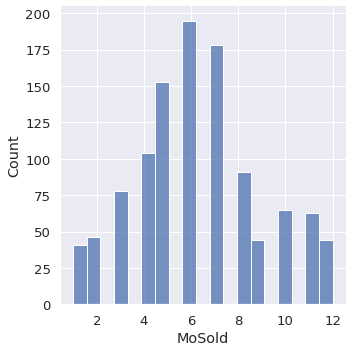

In [159]:
sns.displot(x = 'MoSold', data = combined_clean_train)

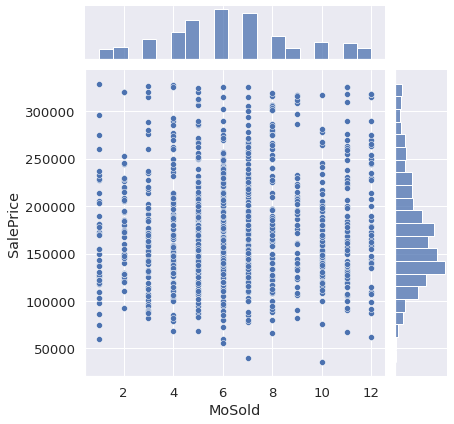

In [160]:
sns.jointplot(x= 'MoSold', y = 'SalePrice', data = combined_clean_train)

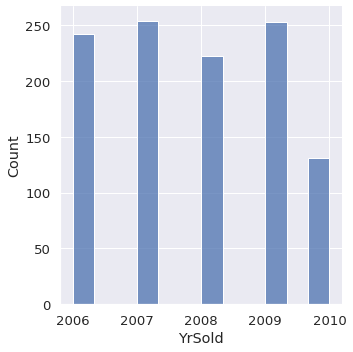

In [161]:
sns.displot(x = 'YrSold', data = combined_clean_train)

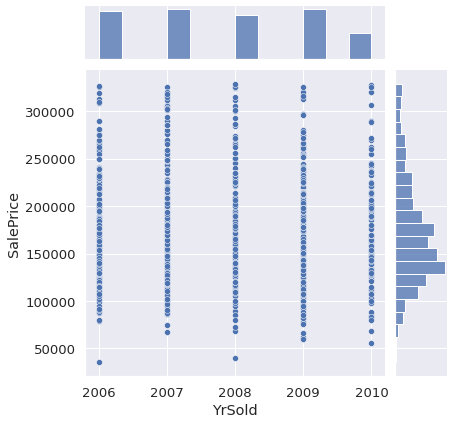

In [162]:
sns.jointplot(x= 'YrSold', y = 'SalePrice', data = combined_clean_train)

**What are we getting from this Plots?!**

- Which year/month sold with most profits
- Which year/month sold most in count
- Does it really mean year that selling less isn't reaching high prices?

- In 2010 Was least year to sell houses but yet we could found that we could still sell with high prices

In [163]:
# combined_clean_train.to_csv('final_mod_house_price.csv', encoding = "UTF-8")
combined_clean_train.to_csv('final_mod_house_price.csv', encoding = "UTF-8")

In [ ]:
## Now let's make get_dummies for categorical value

In [ ]:
# !pip install datasist
# from datasist.structdata import detect_outliers
# ## Not needed since we got 0 outliers
# # idx = detect_outliers(df, 0,['charges'])
# # df = df.drop(idx, axis = 0, inplace=True)
# # df

In [ ]:
## We can check where is the most of companies are depending on employee residence
# city_count = clean['employee_residence'].value_counts()
# cities = city_count[city_count > 10].index
# cities
# sns.countplot(y = 'Neighborhood', data = clean[clean['Neighborhood'].isin(cities)])

In [ ]:
# conditions 1 & 2 are conditions that may exist Norm or not
# - We can make a new column that have 3 types of conditions   
#     - if condition 1 = condition 2 return norm elif condition 1 = norm and condition 2 != norm return half norm if condition 1 != condition 2 return not norm

# Exterior 1st & 2nd: Exterior covering on house


In [ ]:
# di = {"L": 0, "M": 1, "H": 2 }
# df.replace({"Type": di}, inplace=True)

In [ ]:
# clean = pd.get_dummies(clean, columns = ['job_title', 'employee_residence','company_location'], drop_first=True)